<a href="https://colab.research.google.com/github/w1767/MSc-project/blob/main/K-MeansAlgo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [18]:
!pip install -q datascience
!pip uninstall pandas-profiling


Found existing installation: pandas-profiling 3.1.0
Uninstalling pandas-profiling-3.1.0:
  Would remove:
    /usr/local/bin/pandas_profiling
    /usr/local/lib/python3.7/dist-packages/pandas_profiling-3.1.0.dist-info/*
    /usr/local/lib/python3.7/dist-packages/pandas_profiling/*
Proceed (y/n)? y
  Successfully uninstalled pandas-profiling-3.1.0


In [19]:
!pip install pandas-profiling[notebook]

  Using cached pandas_profiling-3.1.0-py2.py3-none-any.whl (261 kB)


In [1]:
!pip show pandas-profiling

Name: pandas-profiling
Version: 3.1.0
Summary: Generate profile report for pandas DataFrame
Home-page: https://github.com/pandas-profiling/pandas-profiling
Author: Simon Brugman
Author-email: pandasprofiling@gmail.com
License: MIT
Location: /usr/local/lib/python3.7/dist-packages
Requires: htmlmin, pandas, phik, tangled-up-in-unicode, scipy, seaborn, pydantic, missingno, tqdm, PyYAML, multimethod, joblib, jinja2, numpy, matplotlib, requests, visions, markupsafe
Required-by: 


In [62]:
!pip install -q --upgrade pandas-profiling

In [2]:
import pandas as pd
import csv
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import scipy as sp
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as sch
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize
import warnings
warnings.filterwarnings('ignore')
from pathlib import Path
filename = "Happiness-Data.csv"


In [3]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
path = "/content/drive/MyDrive/Happiness-Data.csv"

In [5]:
df = pd.read_csv("/content/drive/MyDrive/Happiness-Data.csv")

In [6]:
df.head()

,Country name,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.0,0.949,-0.098,0.186,2.43,1.446,1.106,0.741,0.691,0.124,0.481,3.253
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.7,0.946,0.030,0.179,2.43,1.502,1.108,0.763,0.686,0.208,0.485,2.868
2,Switzerland,Western Europe,7.571,0.036,7.643,7.500,11.117,0.942,74.4,0.919,0.025,0.292,2.43,1.566,1.079,0.816,0.653,0.204,0.413,2.839
3,Iceland,Western Europe,7.554,0.059,7.670,7.438,10.878,0.983,73.0,0.955,0.160,0.673,2.43,1.482,1.172,0.772,0.698,0.293,0.170,2.967
4,Netherlands,Western Europe,7.464,0.027,7.518,7.410,10.932,0.942,72.4,0.913,0.175,0.338,2.43,1.501,1.079,0.753,0.647,0.302,0.384,2.798


rename columns

In [7]:
df.rename(columns = {'Country name':'Country_Name', 'Regional indicator':'Regional_Indicator', 'Ladder score':'Ladder_Score',
                     'Standard error of ladder score':'Standard_Error_of_Ladder_Score', 'upperwhisker':'Upper_Whisker', 'lowerwhisker':'Lower_Whisker','Logged GDP per capita':'Logged_GDP_Per_Capita','Social support':'Social_Support','Healthy life expectancy':'Healthy_Life_Expectancy','Freedom to make life choices':'Freedom_to_Make_Life_Choices','Perceptions of corruption':'Perceptions_of_Corruption', 'Ladder score in Dystopia':'Ladder_Score_in_Dystopia', 'Explained by: Log GDP per capita':'Explained_by:_Log_GDP_Per_Capita',
                    'Explained by: Social support':'Explained_by:_Social_Support','Explained by: Healthy life expectancy':'Explained_by:_Healthy_Life_Expectancy','Explained by: Freedom to make life choices':'Explained_by:_Freedom_to_make_Life_Choices','Explained by: Generosity':'Explained_by:_Generosity','Explained by: Perceptions of corruption':'Explained_by:_Perceptions_of_Corruption','Dystopia + residual':'Dystopia_Residual'}, inplace = True)

In [8]:
df.head()

,Country_Name,Regional_Indicator,Ladder_Score,Standard_Error_of_Ladder_Score,Upper_Whisker,Lower_Whisker,Logged_GDP_Per_Capita,Social_Support,Healthy_Life_Expectancy,Freedom_to_Make_Life_Choices,Generosity,Perceptions_of_Corruption,Ladder_Score_in_Dystopia,Explained_by:_Log_GDP_Per_Capita,Explained_by:_Social_Support,Explained_by:_Healthy_Life_Expectancy,Explained_by:_Freedom_to_make_Life_Choices,Explained_by:_Generosity,Explained_by:_Perceptions_of_Corruption,Dystopia_Residual
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.0,0.949,-0.098,0.186,2.43,1.446,1.106,0.741,0.691,0.124,0.481,3.253
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.7,0.946,0.030,0.179,2.43,1.502,1.108,0.763,0.686,0.208,0.485,2.868
2,Switzerland,Western Europe,7.571,0.036,7.643,7.500,11.117,0.942,74.4,0.919,0.025,0.292,2.43,1.566,1.079,0.816,0.653,0.204,0.413,2.839
3,Iceland,Western Europe,7.554,0.059,7.670,7.438,10.878,0.983,73.0,0.955,0.160,0.673,2.43,1.482,1.172,0.772,0.698,0.293,0.170,2.967
4,Netherlands,Western Europe,7.464,0.027,7.518,7.410,10.932,0.942,72.4,0.913,0.175,0.338,2.43,1.501,1.079,0.753,0.647,0.302,0.384,2.798


In [9]:
df.shape
# finding the dimension of the dataset

(149, 20)

In [10]:
#statistical description
df.describe()

,Ladder_Score,Standard_Error_of_Ladder_Score,Upper_Whisker,Lower_Whisker,Logged_GDP_Per_Capita,Social_Support,Healthy_Life_Expectancy,Freedom_to_Make_Life_Choices,Generosity,Perceptions_of_Corruption,Ladder_Score_in_Dystopia,Explained_by:_Log_GDP_Per_Capita,Explained_by:_Social_Support,Explained_by:_Healthy_Life_Expectancy,Explained_by:_Freedom_to_make_Life_Choices,Explained_by:_Generosity,Explained_by:_Perceptions_of_Corruption,Dystopia_Residual
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,1.490000e+02,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000
mean,5.532839,0.058752,5.648007,5.417631,9.432208,0.814745,64.992799,0.791597,-0.015134,0.727450,2.430000e+00,0.977161,0.793315,0.520161,0.498711,0.178047,0.135141,2.430329
std,1.073924,0.022001,1.054330,1.094879,1.158601,0.114889,6.762043,0.113332,0.150657,0.179226,5.347044e-15,0.404740,0.258871,0.213019,0.137888,0.098270,0.114361,0.537645
min,2.523000,0.026000,2.596000,2.449000,6.635000,0.463000,48.478000,0.382000,-0.288000,0.082000,2.430000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.648000
25%,4.852000,0.043000,4.991000,4.706000,8.541000,0.750000,59.802000,0.718000,-0.126000,0.667000,2.430000e+00,0.666000,0.647000,0.357000,0.409000,0.105000,0.060000,2.138000
50%,5.534000,0.054000,5.625000,5.413000,9.569000,0.832000,66.603000,0.804000,-0.036000,0.781000,2.430000e+00,1.025000,0.832000,0.571000,0.514000,0.164000,0.101000,2.509000
75%,6.255000,0.070000,6.344000,6.128000,10.421000,0.905000,69.600000,0.877000,0.079000,0.845000,2.430000e+00,1.323000,0.996000,0.665000,0.603000,0.239000,0.174000,2.794000
max,7.842000,0.173000,7.904000,7.780000,11.647000,0.983000,76.953000,0.970000,0.542000,0.939000,2.430000e+00,1.751000,1.172000,0.897000,0.716000,0.541000,0.547000,3.482000


In [11]:
prof_data = ProfileReport(df)
prof_data

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
#checking the information on all the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149 entries, 0 to 148
Data columns (total 20 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Country_Name                                149 non-null    object 
 1   Regional_Indicator                          149 non-null    object 
 2   Ladder_Score                                149 non-null    float64
 3   Standard_Error_of_Ladder_Score              149 non-null    float64
 4   Upper_Whisker                               149 non-null    float64
 5   Lower_Whisker                               149 non-null    float64
 6   Logged_GDP_Per_Capita                       149 non-null    float64
 7   Social_Support                              149 non-null    float64
 8   Healthy_Life_Expectancy                     149 non-null    float64
 9   Freedom_to_Make_Life_Choices                149 non-null    float64
 10  Generosity    

In [13]:
#checking the null or NaN value in the dataset
df.isnull().any()

Country_Name                                  False
Regional_Indicator                            False
Ladder_Score                                  False
Standard_Error_of_Ladder_Score                False
Upper_Whisker                                 False
Lower_Whisker                                 False
Logged_GDP_Per_Capita                         False
Social_Support                                False
Healthy_Life_Expectancy                       False
Freedom_to_Make_Life_Choices                  False
Generosity                                    False
Perceptions_of_Corruption                     False
Ladder_Score_in_Dystopia                      False
Explained_by:_Log_GDP_Per_Capita              False
Explained_by:_Social_Support                  False
Explained_by:_Healthy_Life_Expectancy         False
Explained_by:_Freedom_to_make_Life_Choices    False
Explained_by:_Generosity                      False
Explained_by:_Perceptions_of_Corruption       False
Dystopia_Res

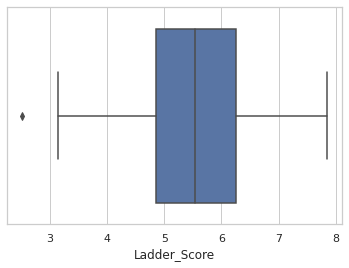

In [14]:
#identification and treatment of any outliers; finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax=sns.boxplot(x=df["Ladder_Score"])

In [15]:
# remove outlier
df = df[(df.Ladder_Score>3)]

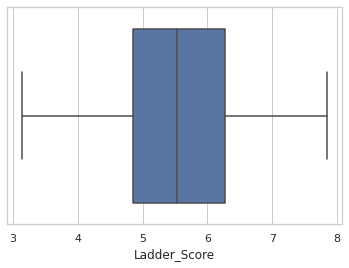

In [18]:
#Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax=sns.boxplot(x=df["Ladder_Score"])

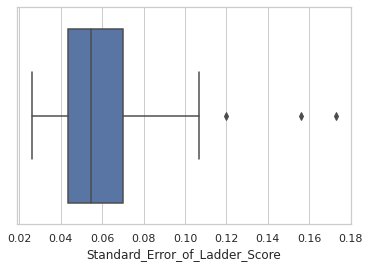

In [19]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Standard_Error_of_Ladder_Score"])

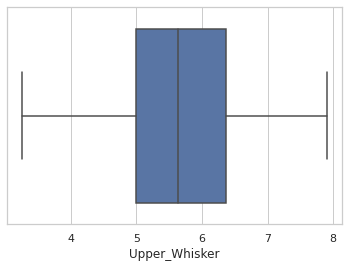

In [20]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Upper_Whisker"])

In [21]:
# Remove outlier
df = df[(df.Upper_Whisker>3)]

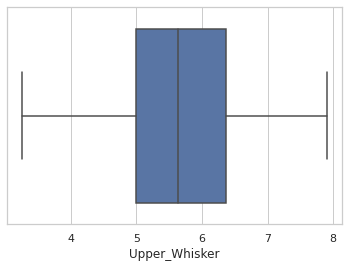

In [22]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Upper_Whisker"])

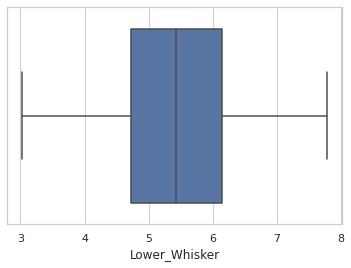

In [23]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Lower_Whisker"])

In [24]:
# Remove outlier
df = df[(df.Lower_Whisker>3)]

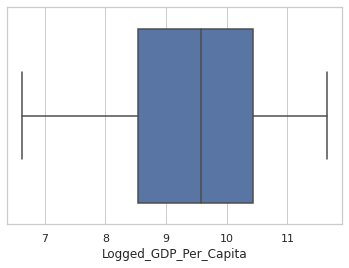

In [25]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Logged_GDP_Per_Capita"])

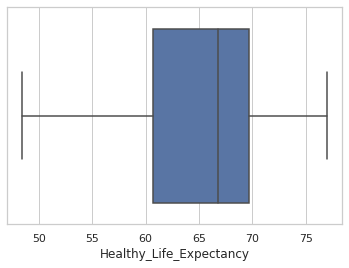

In [29]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Healthy_Life_Expectancy"])

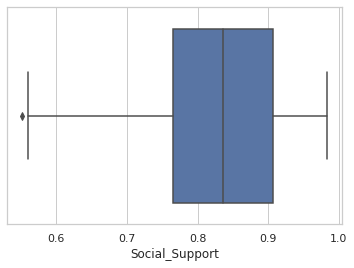

In [30]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Social_Support"])

In [31]:
# Remove outlier
df = df[(df.Social_Support>0.54)]

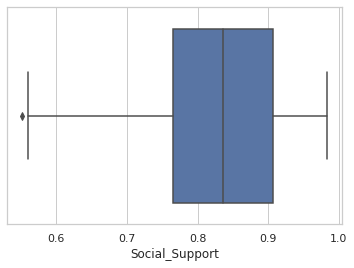

In [32]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Social_Support"])

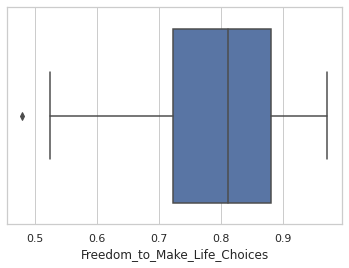

In [33]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Freedom_to_Make_Life_Choices"])

In [34]:
# Remove outlier
df = df[(df.Freedom_to_Make_Life_Choices>0.49)]

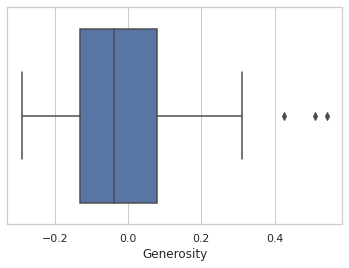

In [35]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Generosity"])

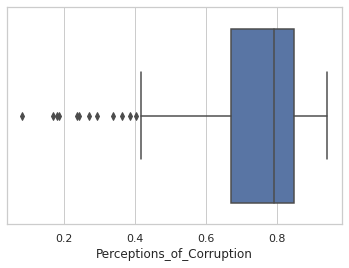

In [36]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Perceptions_of_Corruption"])

In [37]:
# Remove outlier
df = df[(df.Perceptions_of_Corruption>0.53)]

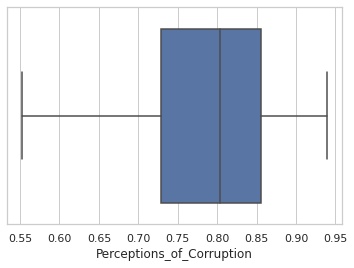

In [38]:
# Finding the outlier in the data set
sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Perceptions_of_Corruption"])

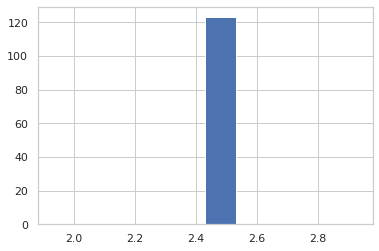

In [39]:
#finding the outlier in the data set
#sns.set_theme(style="whitegrid")
#ax = sns.boxplot(x=df["Ladder_Score_in_Dystopia"])
#fig = plt.figure(figsize = (10,3))
#sns.barplot(y = 'Ladder_Score_Dystopia',data=df)
#plt.ytick(rotation=90)
#plt.show()
#df.Ladder_Score_in_Dystopia.plot.pie();
df.Ladder_Score_in_Dystopia.hist()

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 123 entries, 3 to 147
Data columns (total 20 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Country_Name                                123 non-null    object 
 1   Regional_Indicator                          123 non-null    object 
 2   Ladder_Score                                123 non-null    float64
 3   Standard_Error_of_Ladder_Score              123 non-null    float64
 4   Upper_Whisker                               123 non-null    float64
 5   Lower_Whisker                               123 non-null    float64
 6   Logged_GDP_Per_Capita                       123 non-null    float64
 7   Social_Support                              123 non-null    float64
 8   Healthy_Life_Expectancy                     123 non-null    float64
 9   Freedom_to_Make_Life_Choices                123 non-null    float64
 10  Generosity    

In [41]:
#selecting the datasert for the further analysis
df_no = df.iloc[:,2:]

In [42]:
#normalize the dataset
x = normalize(df_no)


ValueError: ignored

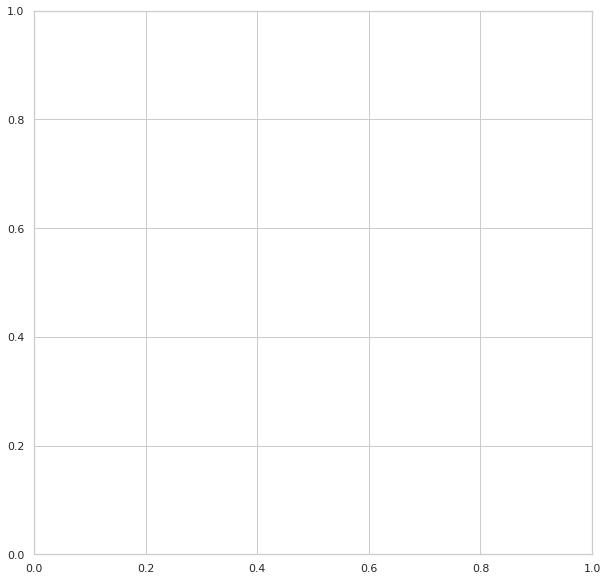

In [44]:
#finding theKmean cluster values
sum_of_sq_dist = []
for i in range(1,11):
  model = KMeans(n_clusters = i, init = "k-means++")
  model.fit(x)
  sum_of_sq_dist.append(model.inertia_)
  plt.figure(figsize=(10,10))
  plt.plot(range(1,11),sum_of_sq_dist)
  plt.xlabel('Number of Clusters')
  plt.ylable('sum_of_sq_dist')
  plt.show()